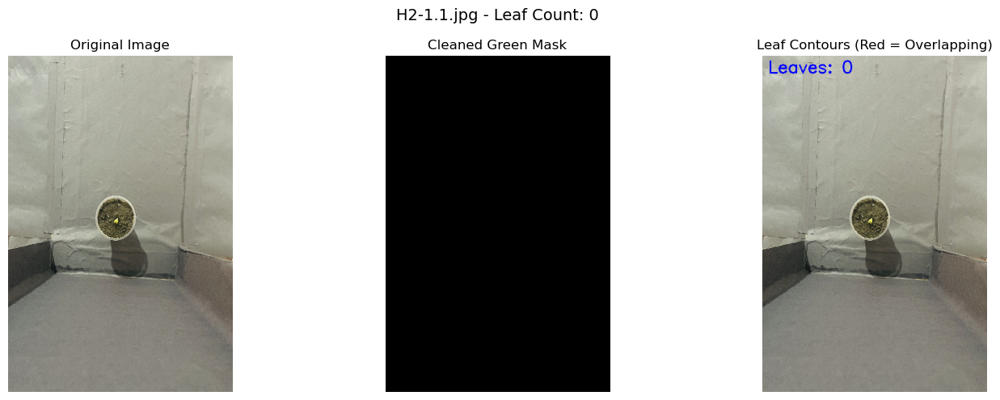

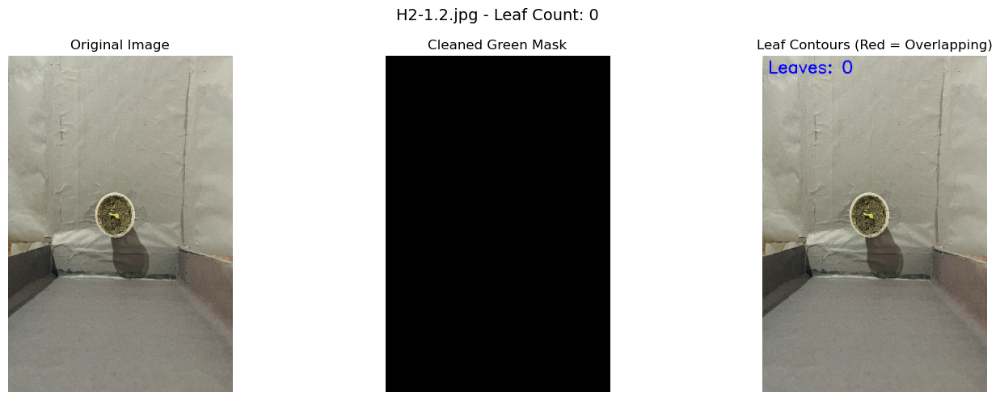

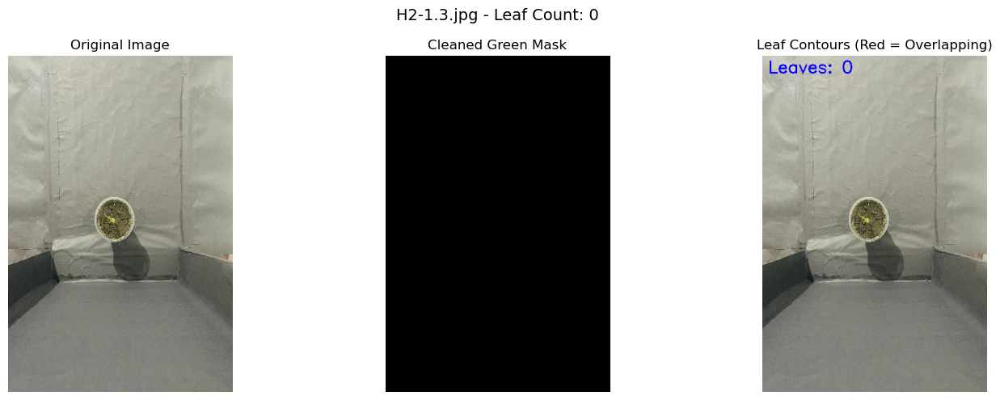

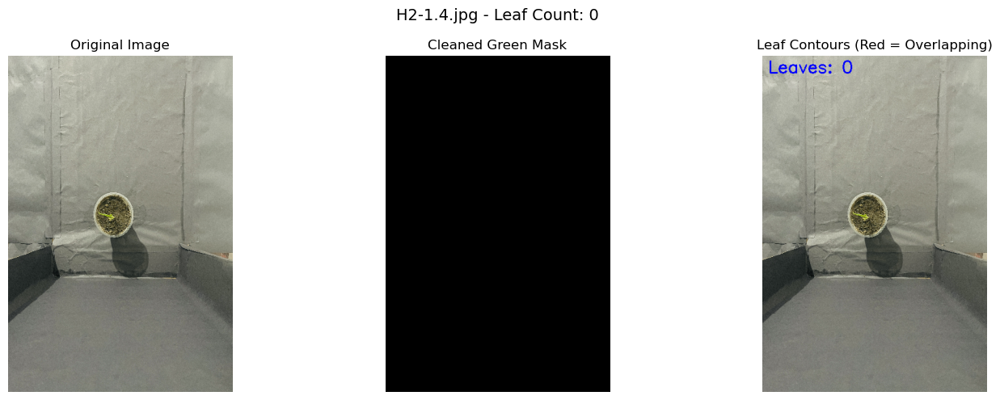

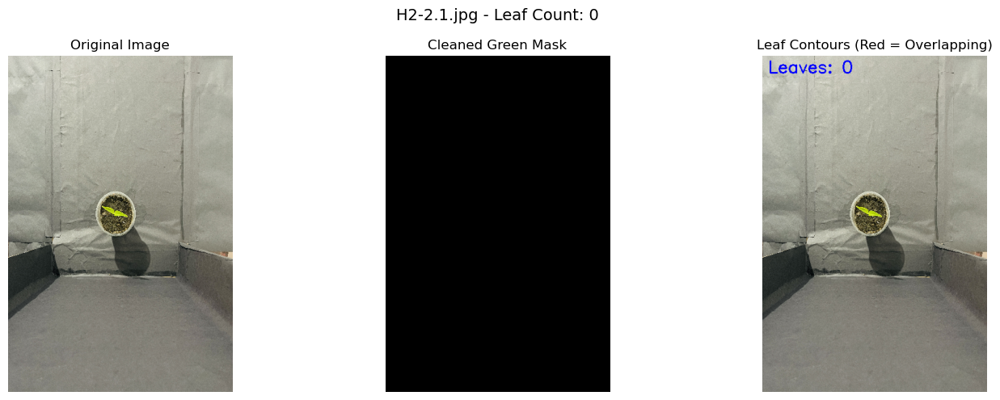

...

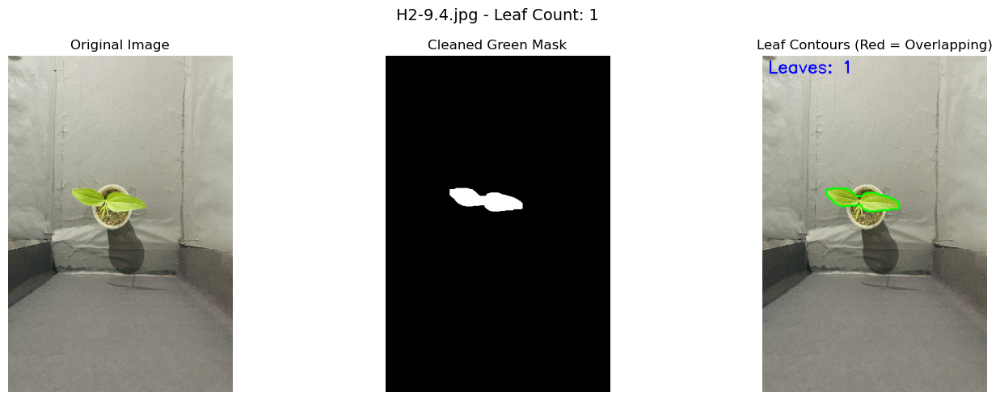

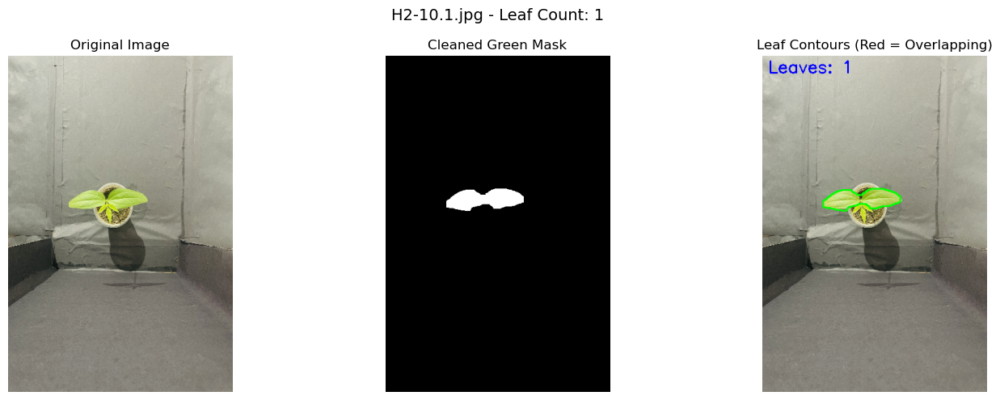

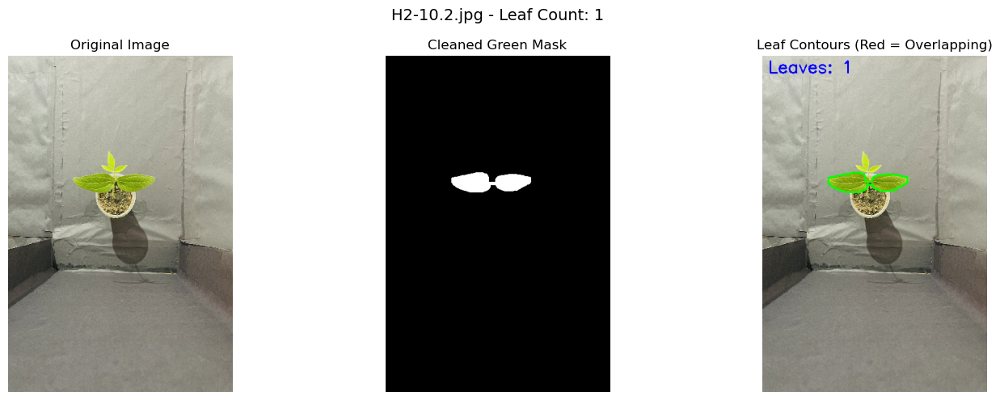

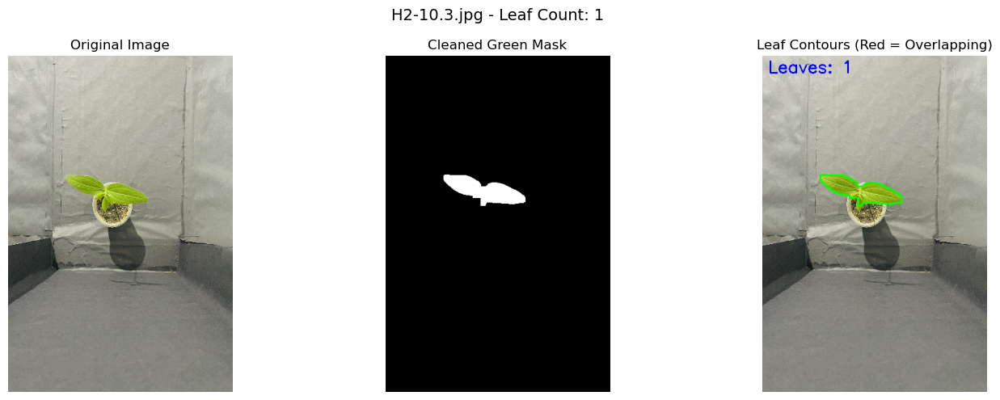

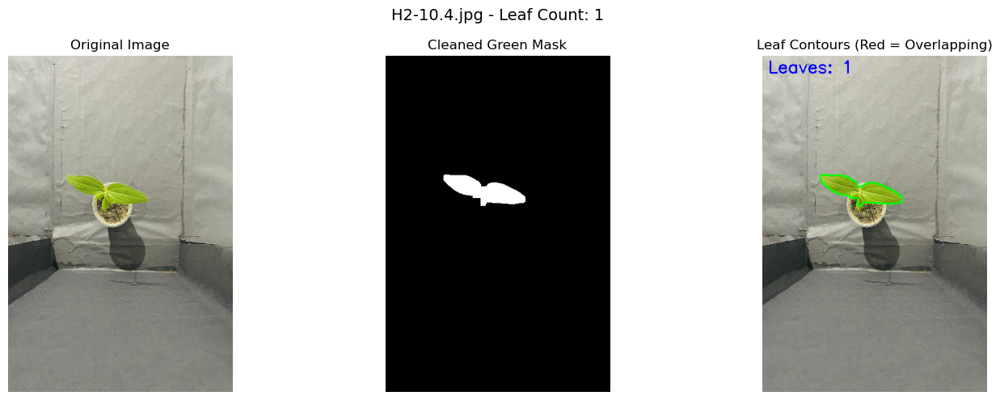


Image		Leaf Count
H2-1.1.jpg	0
H2-1.2.jpg	0
H2-1.3.jpg	0
H2-1.4.jpg	0
H2-2.1.jpg	0
H2-2.2.jpg	1
H2-2.3.jpg	1
H2-2.4.jpg	1
H2-3.1.jpg	1
H2-3.2.jpg	1
H2-3.3.jpg	1
H2-3.4.jpg	1
H2-4.1.jpg	1
H2-4.2.jpg	1
H2-4.3.jpg	1
H2-4.4.jpg	1
H2-5.1.jpg	1
H2-5.2.jpg	1
H2-5.3.jpg	1
H2-5.4.jpg	1
H2-6.1.jpg	1
H2-6.2.jpg	1
H2-6.3.jpg	1
H2-6.4.jpg	1
H2-7.1.jpg	1
H2-7.2.jpg	1
H2-7.3.jpg	1
H2-7.4.jpg	1
H2-8.1.jpg	1
H2-8.2.jpg	1
H2-8.3.jpg	1
H2-8.4.jpg	1
H2-9.1.jpg	1
H2-9.2.jpg	1
H2-9.3.jpg	1
H2-9.4.jpg	1
H2-10.1.jpg	1
H2-10.2.jpg	1
H2-10.3.jpg	1
H2-10.4.jpg	1


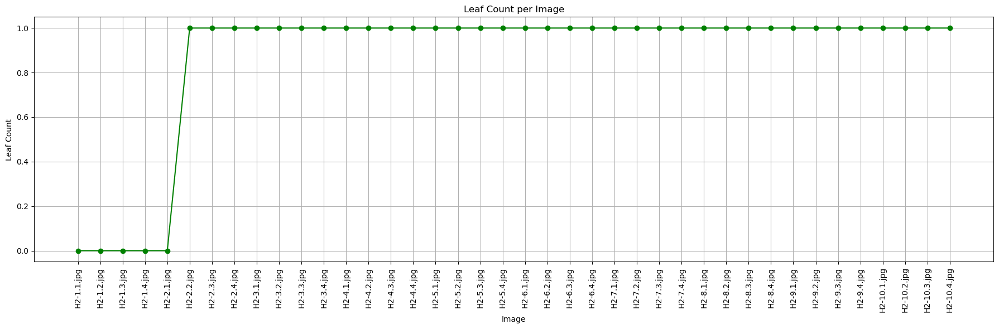

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

folder_path = r"C:\Users\Sandeepa Sahil\Desktop\sample code\Discoloration"
image_names = [f"H2-{day}.{i}.jpg" for day in range(1, 11) for i in range(1, 5)]
leaf_counts = []

def count_leaves_with_contours(img, name):
    resized = cv2.resize(img, (400, 600))
    blurred = cv2.GaussianBlur(resized, (5, 5), 0)
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = np.ones((5, 5), np.uint8)
    cleaned_mask = cv2.morphologyEx(green_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    contours, _ = cv2.findContours(cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    min_area = 300
    valid_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    overlapping_pairs = []
    for i in range(len(valid_contours)):
        x1, y1, w1, h1 = cv2.boundingRect(cv2.convexHull(valid_contours[i]))
        for j in range(i + 1, len(valid_contours)):
            x2, y2, w2, h2 = cv2.boundingRect(cv2.convexHull(valid_contours[j]))
            if x1 < x2 + w2 and x1 + w1 > x2 and y1 < y2 + h2 and y1 + h1 > y2:
                overlapping_pairs.append((i, j))
    result_img = resized.copy()
    for idx, cnt in enumerate(valid_contours):
        color = (0, 0, 255) if any(idx in pair for pair in overlapping_pairs) else (0, 255, 0)
        cv2.drawContours(result_img, [cnt], -1, color, 2)
    leaf_count = len(valid_contours)
    cv2.putText(result_img, f"Leaves: {leaf_count}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"{name} - Leaf Count: {leaf_count}", fontsize=14)
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(cleaned_mask, cmap='gray')
    plt.title("Cleaned Green Mask")
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title("Leaf Contours (Red = Overlapping)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    return leaf_count

for name in image_names:
    full_path = folder_path + "/" + name
    img = cv2.imread(full_path)
    if img is None:
        print(f"Image not found: {name}")
        leaf_counts.append((name, 0))
        continue
    count = count_leaves_with_contours(img, name)
    leaf_counts.append((name, count))

print("\nImage\t\tLeaf Count")
for name, count in leaf_counts:
    print(f"{name}\t{count}")

image_labels = [name for name, _ in leaf_counts]
leaf_values = [count for _, count in leaf_counts]

plt.figure(figsize=(18, 6))
plt.plot(image_labels, leaf_values, marker='o', color='green')
plt.xlabel("Image")
plt.ylabel("Leaf Count")
plt.title("Leaf Count per Image")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()